Imports and setup

In [1]:
import pickle
import numpy as np
from rdkit import Chem
import rdkit.Chem.QED
import torch

from coati.models.io.coati import load_e3gnn_smiles_clip_e2e
from coati.models.regression.basic_due import basic_due
from coati.common.util import batch_indexable
from coati.generative.coati_purifications import force_decode_valid, embed_smiles

# set your device
DEVICE = torch.device("cuda:0")

Load model

In [2]:
# Model parameters are pulled from the url and stored in a local models/ dir.
encoder, tokenizer = load_e3gnn_smiles_clip_e2e(
    freeze=True,
    device=DEVICE,
    # model parameters to load.
    doc_url="s3://terray-public/models/barlow_closed.pkl",
)

Loading model from s3://terray-public/models/barlow_closed.pkl
Loading tokenizer may_closedparen from s3://terray-public/models/barlow_closed.pkl
number of parameters: 12.64M
number of parameters Total: 2.44M xformer: 17.92M Total: 20.36M 
vocab_name not found in tokenizer_vocabs, trying to load from file
Freezing encoder
20561664 params frozen!


In this example we will consider binding activity of various compounds for the target protein Human carbonic anhydrase II (hCAII),  where several hundred
pIC50 datapoints are available in CHEMBL.


In [3]:
# load Chembl pIC50 data from the local file
with open("chembl_pic50.pkl", "rb") as f:
    outsample = pickle.load(f)

In [4]:
def embed_and_score_in_batches(
    records,
    encoder=encoder,
    tokenizer=tokenizer,
    batch_size=128,
    rdkit_scores={},
    model_scores={},
    smiles_field="smiles",
):
    # A helper function to compute embeddings from the model encoder and
    # rdkit properties of molecules in batches. Predictions from other models
    # can also be supplied.
    #
    # The input list of dict records is modified in place.

    # check that the rdkit and model scores are functions
    assert all([callable(score_fn) for score_fn in rdkit_scores.values()])

    # check that the rdkit and model keys are unique
    assert len(set(rdkit_scores.keys()).intersection(set(model_scores.keys()))) == 0

    print("Embedding and scoring iterable from smiles.")
    batch_iter = batch_indexable(records, batch_size)
    num_batches = len(records) // batch_size
    with torch.no_grad():
        for i, batch in enumerate(batch_iter):
            print(f"batch: {i}/{num_batches}")
            try:
                batch_mols = [Chem.MolFromSmiles(row[smiles_field]) for row in batch]
                batch_smiles = [Chem.MolToSmiles(m) for m in batch_mols]
                batch_tokens = torch.tensor(
                    [
                        tokenizer.tokenize_text("[SMILES]" + s + "[STOP]", pad=True)
                        if s != "*"
                        else tokenizer.tokenize_text("[SMILES]C[STOP]", pad=True)
                        for s in batch_smiles
                    ],
                    device=encoder.device,
                    dtype=torch.int,
                )
                batch_embeds = encoder.encode_tokens(batch_tokens, tokenizer)

                batch_scores = {}
                for quantity, score_fn in rdkit_scores.items():
                    batch_scores[quantity] = [score_fn(m) for m in batch_mols]
                for quantity, score_fn in model_scores.items():
                    batch_scores[quantity] = score_fn(batch_embeds).squeeze()

                for k, r in enumerate(batch):
                    batch[k]["emb_smiles"] = batch_embeds[k].detach().cpu().numpy()
                    for quantity in batch_scores.keys():
                        if quantity in model_scores.keys():
                            batch[k][quantity] = (
                                batch_scores[quantity][k].detach().cpu().item()
                            )
                        else:
                            batch[k][quantity] = batch_scores[quantity][k]

            except Exception as Ex:
                print(Ex)
                continue

For this dataset, we compute the embeddings from the model encoder for the given molecule smile string and the RDKit properties: LogP and quantitative estimate of druglikeness (QED). These quantities are added to the dataset in place.

In [5]:
# callable functions to compute rdkit quantities.
rdkit_scores = {
    "qed_rdkit": rdkit.Chem.QED.qed,
    "logp_rdkit": rdkit.Chem.Crippen.MolLogP,
    "mol_wt_rdkit": rdkit.Chem.Descriptors.ExactMolWt,
}

# embed and score the dataset in batches and in place.
embed_and_score_in_batches(outsample, rdkit_scores=rdkit_scores)

Embedding and scoring iterable from smiles.
batch: 0/4
batch: 1/4
batch: 2/4
batch: 3/4
batch: 4/4


Load a pretrained DUE model that was trained directly on Terray Platform data (experimental) for hCAII. This model infers an activity measure on hCAII for a given compound. The full dataset contains 1.3M distinct compounds (whereas the Chembl dataset above is only ~500 datapoints). For more info on the DUE model regression process, see `due_model_regression.ipynb`. 


To briefly summarize the experimental assay: molecules are produced by combinatorial
synthesis tethered to polymer beads immobilized on a silicon chip. A fluorescent tagged target protein is flowed
over the chip, incubated, and microscopy is used to quantify the amount of bound protein as a ratio of fluorescence
on each bead to an empty background. This ratio is referred to as the foldover and
correlates with corresponding pIC50 results off the Terray platform.


In [6]:
# load a pretrained DUE model on Terray Platform data.
hcaii_model = torch.load("due_hcaii_barlow_terray.pt").to(DEVICE)

In [7]:
import pandas as pd

# inferred platform foldover predictions
pred = hcaii_model(
    torch.tensor([row["emb_smiles"] for row in outsample], device=DEVICE)
)
infd_fo = pred.mean

outsample_frm = pd.DataFrame(outsample)
outsample_frm["pred_ic50"] = np.log(infd_fo.detach().cpu().numpy())
outsample_frm["log pic50"] = np.log(outsample_frm.pIC50)

print("Correlation between predicted and observed pIC50 values:")
outsample_frm[["pIC50", "pred_ic50", "log pic50"]].corr()

/tmp/ipykernel_1552900/3521470289.py:5: UserWarning: Creating a tensor from a list of numpy.ndarrays is extremely slow. Please consider converting the list to a single numpy.ndarray with numpy.array() before converting to a tensor. (Triggered internally at ../torch/csrc/utils/tensor_new.cpp:245.)
  torch.tensor([row["emb_smiles"] for row in outsample], device=DEVICE)


Correlation between predicted and observed pIC50 values:


,pIC50,pred_ic50,log pic50
pIC50,1.000000,0.124813,0.956425
pred_ic50,0.124813,1.000000,0.155176
log pic50,0.956425,0.155176,1.000000


Text(0, 0.5, 'pIC50')

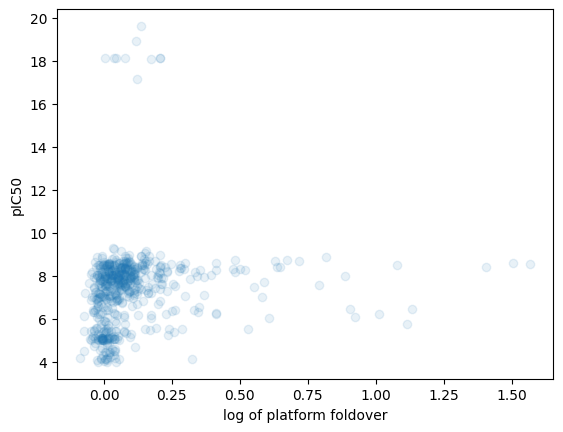

In [8]:
import matplotlib.pyplot as plt

plt.scatter(
    np.log(infd_fo.detach().cpu().numpy()),
    [row["pIC50"] for row in outsample],
    alpha=0.1,
)

plt.xlabel("log of platform foldover")
plt.ylabel("pIC50")

# Metadynamics

Load pretrained DUE regression models on RDKit-calculated QED and log P scores for a Chembl subset. These models were trained in `due_model_regression.ipynb`.  

In [9]:
qed_model = torch.load("due_qed_barlow.pt").to(DEVICE)
logp_model = torch.load("due_logp_barlow.pt").to(DEVICE)

Below are the various objective functions used in the metadynamics as presented in the paper.

In [10]:
def var_objective_fcn(v):
    """
    The activity objective.
    """
    res = hcaii_model(v.unsqueeze(0).to(DEVICE))
    return -5 * (res.mean - res.stddev).to(DEVICE)


def get_pic50s(v):
    res = hcaii_model(v.to(DEVICE))
    return res.mean.to(DEVICE)


def get_qed(v):
    return qed_model(v.unsqueeze(0)).mean


def get_logp(v):
    return logp_model(v.unsqueeze(0)).mean


def qed_penalty(v):
    """
    Penalize QED < 0.5. Loss is squared to make it smooth.
    """
    return torch.pow(30.0 * torch.nn.functional.relu(0.5 - get_qed(v)), 2.0)


def logp_penalty(v):
    """
    Penalize logP > 5. Loss is squared to make it smooth.
    """
    return torch.pow(4 * torch.nn.functional.relu(get_logp(v) - 5.0), 2.0)

Metadynamics routines as described in the paper.

In [11]:
from coati.generative.coati_purifications import force_decode_valid_batch
from coati.generative.coati_purifications import purify_vector


def bump_potential(V, bumps=[], radius=0.125, height=80.0, vec_dim=256):
    """
    Explore space by using gaussian bump potentials when the vector isn't
    changing a lot.
    """

    if len(bumps) < 1:
        return torch.zeros(1, device=V.device)

    bump_potential = (
        height
        * (
            (
                torch.distributions.multivariate_normal.MultivariateNormal(
                    torch.stack(bumps, 0).to(V.device),
                    radius * torch.eye(vec_dim).to(V.device),
                ).log_prob(V)
                + (vec_dim / 2) * (np.log(2 * torch.pi) + np.log(radius))
            ).exp()
        ).sum()
    )

    return bump_potential


def coati_metadynamics(
    init_emb_vec,
    objective_fcn,
    encoder,
    tokenizer,
    constraint_functions=[],  # enforced to == 0 by lagrange multipliers.
    log_functions=[],
    bump_radius=0.125 * 4,
    bump_height=80.0 * 16,
    nsteps=4000,
    save_traj_history=None,
):
    """
    Minimize an objective function in coati space.
    Purifies the vector as it goes along.
    The purified vector satisfies:
      vec \approx purify_vector(vec)

    contraint_functions: list of dict
        routines returning 'constraint_name' : tensor pairs.
    log_functions: list of dict
        routines returning 'value_name' : tensor pairs.

    Returns:
        history: (list of dict). Trajectory history.
    """
    vec = torch.nn.Parameter(init_emb_vec.to(encoder.device))
    vec.requires_grad = True

    # setup optimizer (SGD, Adam, etc.)
    params = [vec]
    for _ in constraint_functions.keys():
        params.append(torch.nn.Parameter(100 * torch.ones_like(vec[:1])))

    # optimizer = torch.optim.Adam(params,lr = 2e-3)
    optimizer = torch.optim.SGD(params, lr=2e-3)

    smiles = force_decode_valid_batch(init_emb_vec, encoder, tokenizer)
    history = [
        {
            "emb": vec.flatten().detach().cpu().numpy(),
            "name": 0,
            "smiles": smiles,
            "library": "opt",
            "activity": objective_fcn(vec).item(),
            **{
                c: constraint_functions[c](vec).detach().cpu().numpy()
                for c in constraint_functions
            },
            **{c: log_functions[c](vec).detach().cpu().numpy() for c in log_functions},
        }
    ]

    # no bumps are initialized.
    bumps = []
    last_bump = 0
    save_every = 25
    project_every = 15
    for k in range(nsteps):
        if k % project_every == 0 and k > 0:
            vec.data = 0.4 * vec.data + 0.6 * purify_vector(
                vec.data, encoder, tokenizer, n_rep=50
            )

        optimizer.zero_grad()
        activity = objective_fcn(vec)

        constraint_values = []
        for f in constraint_functions.keys():
            constraint_values.append(constraint_functions[f](vec))
        if len(constraint_values):
            constraint_term = torch.sum(torch.concat(constraint_values))
        else:
            constraint_term = torch.zeros_like(activity)

        # add a bump_term to the loss (=0 if no bumps).
        bump_term = bump_potential(vec, bumps, radius=bump_radius, height=bump_height)

        loss = activity + constraint_term + bump_term
        loss.backward()  # retain_graph=True)

        if k % save_every == 0:
            # Try to decode the vector here into a molecule!.
            smiles = force_decode_valid_batch(vec, encoder, tokenizer)

            history.append(
                {
                    "emb": vec.flatten().detach().cpu().numpy(),
                    "name": k,
                    "smiles": smiles,
                    "library": "opt",
                    "loss": loss.detach().cpu().item(),
                    "activity": activity.detach().cpu().item(),
                    "bump_term": bump_term.detach().cpu().item(),
                    "const_term": constraint_term.detach().cpu().item(),
                    **{
                        c: log_functions[c](vec).detach().cpu().item()
                        for c in log_functions
                    },
                }
            )

            v1 = history[-1]["emb"]
            v2 = history[-2]["emb"]
            s1 = history[-1]["smiles"]
            s2 = history[-2]["smiles"]

            # build log string
            log_str = f"{k}: dV {np.linalg.norm(v1-v2):.3e} "
            to_log = ["loss", "activity", "bump_term", "const_term"] + list(
                log_functions.keys()
            )
            for l in to_log:
                log_str = log_str + f"{l}:{history[-1][l]:.2f} "

            if (
                ((v1 * v2).sum() / (np.linalg.norm(v1) * np.linalg.norm(v2)) > 0.85)
                and (k - last_bump > 25)
            ) or (s1 == s2 and k > 50):
                print("adding bump ", smiles)
                last_bump = k
                new_bump = torch.from_numpy(v1).to(device=vec.device)
                bumps.append(new_bump)

            if save_traj_history is not None:
                # save trajectory to file
                with open(save_traj_history, "wb") as f:
                    pickle.dump(history, f)

            print(log_str)

        optimizer.step()

    return history

Start the metadynamics trajectory from 3 randomly generated molecules from the model. See `generation_examples.ipynb` for more info.

In [12]:
# draw 128 molecules from the model.
drawn = []
nbtch = 1
for k in range(nbtch):
    with torch.no_grad():
        drawn.extend(
            encoder.complete_batch(
                ["[SET][chembl_mols][SMILES]" for _ in range(128)],
                tokenizer,
                inv_temp=2.0,
                k=10000,
            )
        )

# Filter out the invalid ones.
valid_drawn = []
for d in drawn:
    try:
        m = Chem.MolFromSmiles(d)
        if not m is None:
            valid_drawn.append(d)
    except Exception as Ex:
        pass

# Initialize 3 molecules to begin the metadynamics.
init_mols = [{"SMILES": s} for s in valid_drawn[:3]]

Run metadynamics with the potency (binding) objective function outlined in the paper.

In [13]:
# note: 40_000 steps were used in the paper
nsteps = 2_000
meta_traj_binding = []
for k, rec in enumerate(init_mols):
    traj = coati_metadynamics(
        # this sets the initial molecule you start from.
        embed_smiles(rec["SMILES"], encoder, tokenizer).to(DEVICE),
        # the constraints below will be added to this.
        var_objective_fcn,
        encoder,
        tokenizer,
        bump_radius=0.125 * 4,
        bump_height=80.0 * 16,
        # enforced to == 0 by lagrange multipliers.
        constraint_functions={"logp_p": logp_penalty, "qed_p": qed_penalty},
        # These functions results will logged in the trajectory history.
        log_functions={"logp": get_logp, "qed": get_qed},
        nsteps=nsteps,
        save_traj_history=f"./meta_traj_binding_{k}.pkl",
    )
    for r in traj:
        r["library"] = "opt_" + str(k)
    meta_traj_binding.extend(traj)

0: dV 0.000e+00 loss:-3.77 activity:-4.41 bump_term:0.00 const_term:0.64 logp:4.66 qed:0.46 
25: dV 2.955e-01 loss:-4.41 activity:-4.41 bump_term:0.00 const_term:0.00 logp:4.52 qed:0.50 
adding bump  O=C(Nc1ccc(Nc2ccccc2)cc1)c1ccc(N2CCCC2=O)c([N+](=O)[O-])c1
50: dV 1.723e+00 loss:-4.44 activity:-4.50 bump_term:0.00 const_term:0.06 logp:4.68 qed:0.49 
75: dV 4.501e+00 loss:-4.54 activity:-4.54 bump_term:0.00 const_term:0.00 logp:3.54 qed:0.89 
adding bump  O=C(Nc1ccc(N2CCCC2=O)cc1)c1ccc(N2CCCC2)cc1
100: dV 1.164e+00 loss:-4.48 activity:-4.48 bump_term:0.00 const_term:0.00 logp:3.63 qed:0.87 
adding bump  O=C(Nc1ccc(N2CCCC2=O)cc1)c1ccc(N2CCCC2)cc1
125: dV 2.488e+00 loss:-2.53 activity:-5.16 bump_term:2.63 const_term:0.00 logp:3.57 qed:0.77 
adding bump  O=C(Nc1ccc(N2CCCC2=O)cc1)c1ccc(N2CCCC2)cc1
150: dV 1.939e+00 loss:88.06 activity:-4.24 bump_term:92.30 const_term:0.00 logp:3.80 qed:0.84 
adding bump  O=C(Nc1ccc(N2CCCC2=O)cc1)c1ccc(N2CCCC2)cc1
175: dV 2.863e+00 loss:-1.70 activity:-2.06

A control experiment with an objective which optimizes QED instead of potency (no-binding).

In [14]:
def logp_penalty(v):
    return torch.pow(4 * torch.nn.functional.relu(4.0 - get_logp(v)), 2.0)


# note: 40_000 steps were used in the paper
nsteps = 2_000
meta_traj_no_binding = []
for k, rec in enumerate(init_mols):
    traj = coati_metadynamics(
        embed_smiles(rec["SMILES"], encoder, tokenizer).to(
            DEVICE
        ),  # this sets the molecule you start from.
        lambda X: -10 * get_qed(X),  # the constraints below will be added to this.
        encoder,
        tokenizer,
        bump_radius=0.125 * 4,
        bump_height=80.0 * 16,
        constraint_functions={
            "logp_p": logp_penalty
        },  # enforced to == 0 by lagrange multipliers.
        log_functions={
            "logp": get_logp,
            "qed": get_qed,
        },  # These log functions will get appended to the history list-dict returned.
        nsteps=nsteps,
        save_traj_history=f"./meta_traj_no_binding_{k}.pkl",
    )
    for r in traj:
        r["library"] = "opt_" + str(k)
    meta_traj_no_binding.extend(traj)

0: dV 0.000e+00 loss:-4.43 activity:-4.43 bump_term:0.00 const_term:0.00 logp:4.66 qed:0.44 
25: dV 2.424e-01 loss:-4.77 activity:-4.77 bump_term:0.00 const_term:0.00 logp:4.62 qed:0.47 
adding bump  O=C(Nc1ccc(Nc2ccccc2)cc1)c1ccc(N2CCCC2=O)c([N+](=O)[O-])c1
50: dV 5.711e-01 loss:-4.77 activity:-4.77 bump_term:0.00 const_term:0.00 logp:4.64 qed:0.47 
75: dV 4.471e+00 loss:-8.32 activity:-8.92 bump_term:0.00 const_term:0.60 logp:3.81 qed:0.89 
adding bump  O=C(Nc1ccc(N2CCCC2=O)cc1)c1ccc(N2CCCC2)cc1
100: dV 9.769e-01 loss:-8.67 activity:-8.70 bump_term:0.00 const_term:0.03 logp:3.99 qed:0.87 
adding bump  O=C(Nc1ccc(N2CCCC2=O)cc1)c1ccc(N2CCCC2)cc1
125: dV 2.781e+00 loss:-7.02 activity:-7.58 bump_term:0.56 const_term:0.00 logp:6.51 qed:0.75 
150: dV 2.985e+00 loss:-7.82 activity:-9.62 bump_term:1.80 const_term:0.00 logp:4.18 qed:0.96 
adding bump  O=C(Nc1ccc(N2CCCC2=O)cc1)c1ccc(C2CCCC2)cc1
175: dV 4.707e-01 loss:-8.73 activity:-9.31 bump_term:0.58 const_term:0.00 logp:4.26 qed:0.93 
200: 

Find embeddings and scores for the computed molecular trajectories.

In [15]:
model_scores = {"pic50_model": get_pic50s, "qed_model": get_qed, "logp_model": get_logp}

embed_and_score_in_batches(
    meta_traj_binding, rdkit_scores=rdkit_scores, model_scores=model_scores
)
embed_and_score_in_batches(
    meta_traj_no_binding, rdkit_scores=rdkit_scores, model_scores=model_scores
)
embed_and_score_in_batches(
    outsample, rdkit_scores=rdkit_scores, model_scores=model_scores
)

Embedding and scoring iterable from smiles.
batch: 0/1
batch: 1/1
Embedding and scoring iterable from smiles.
batch: 0/1
batch: 1/1
Embedding and scoring iterable from smiles.
batch: 0/4
batch: 1/4
batch: 2/4
batch: 3/4
batch: 4/4


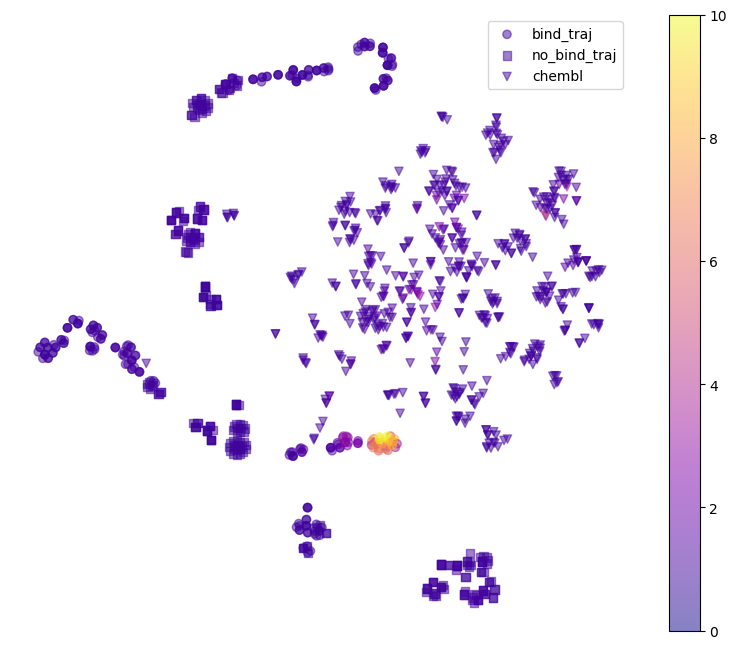

In [16]:
import matplotlib
import pandas as pd
from sklearn.manifold import TSNE

for r in meta_traj_binding:
    r["library"] = "meta_binding"
for r in meta_traj_no_binding:
    r["library"] = "meta_qed"
for r in outsample:
    r["library"] = "chembl"
to_score = meta_traj_binding + meta_traj_no_binding + outsample
df = pd.DataFrame(to_score)

embs = np.stack(df["emb_smiles"].values.tolist(), 0)
X_embedded = TSNE(n_components=2, learning_rate=100, init="random").fit_transform(embs)
df.loc[:, "X"] = X_embedded[:, 0]
df.loc[:, "Y"] = X_embedded[:, 1]
norm = matplotlib.colors.Normalize(vmin=0, vmax=5.0)

plt.figure(figsize=(10, 8))
plt.scatter(
    df[df.library == "meta_binding"].X,
    df[df.library == "meta_binding"].Y,
    c=df[df.library == "meta_binding"].pic50_model,
    norm=norm,
    marker="o",
    cmap="plasma",
    alpha=0.5,
    label="bind_traj",
)
plt.scatter(
    df[df.library == "meta_qed"].X,
    df[df.library == "meta_qed"].Y,
    c=df[df.library == "meta_qed"].pic50_model,
    norm=norm,
    marker="s",
    cmap="plasma",
    alpha=0.5,
    label="no_bind_traj",
)
plt.scatter(
    df[df.library == "chembl"].X,
    df[df.library == "chembl"].Y,
    c=df[df.library == "chembl"].pic50_model,
    norm=norm,
    marker="v",
    cmap="plasma",
    alpha=0.5,
    label="chembl",
)
plt.clim(0, 10.0)
plt.legend()
plt.colorbar()
plt.axis("off")
plt.savefig("trajs_tsne.pdf", dpi=300, bbox_inches="tight")
plt.show()

Get an interactive version of the above plot of trajectories. Hover over the datapoints to see values and molecules!

In [17]:
from coati.generative.embed_altair import embed_altair

chart = embed_altair(
    df,
    tooltip_fields=["smiles", "mol_index", "pic50_model", "logp_rdkit", "qed_rdkit"],
    selector_field="library",
    quantity="pic50_model",
    image_tooltip=True,
    emb_field="emb_smiles",
    smiles_field="smiles",
    width=1024,
    height=768,
)


# save chart to html file for "offline" viewing.
chart.save("meta_dyn_trajs.html")
chart

/home/ewilliams/venvs/coati_test/lib/python3.8/site-packages/altair/utils/deprecation.py:65: AltairDeprecationWarning: 'selection_multi' is deprecated.  Use 'selection_point'
  warnings.warn(message, AltairDeprecationWarning, stacklevel=1)
/home/ewilliams/venvs/coati_test/lib/python3.8/site-packages/altair/utils/deprecation.py:65: AltairDeprecationWarning: 'add_selection' is deprecated. Use 'add_params' instead.
  warnings.warn(message, AltairDeprecationWarning, stacklevel=1)


alt.HConcatChart(...)

We can also visualize the metadynamics trajectory as a gif of molecules visited

In [18]:
images = []
for traj in meta_traj_binding:
    try:
        k = traj["name"]
        fo = traj["pic50_model"]
        qed = traj["qed_model"]
        logp = traj["logp_model"]
        images.append(
            Chem.Draw.MolToImage(
                Chem.MolFromSmiles(traj["smiles"]),
                legend=f"k {k} fo {fo:.2f} qed {qed:.2f} logp {logp:.2f}",
            )
        )
    except:
        pass

# save gif corresponding to the trajectory of the first random initial molecule.
images[0].save(
    "binding_meta_example.gif",
    save_all=True,
    append_images=images[1:],
    optimize=False,
    duration=120,
    loop=0,
)

Display the gif in notebook


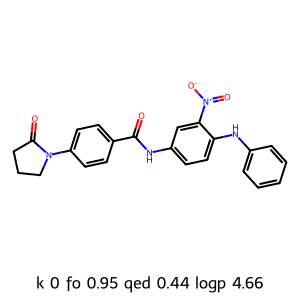

In [19]:
from IPython.display import HTML
import base64

gif_path = "binding_meta_example.gif"
b64 = base64.b64encode(open(gif_path, "rb").read()).decode("ascii")
display(HTML(f'<img src="data:image/gif;base64,{b64}" />'))

hit threshold: 2.9949214458465576, max score: 10.613380432128906

Most similar generated molecule to known molecules, cosine simularity score:  0.98289156
 logp_model: 1.884050726890564 qed_model: 0.63335782289505 pic50_model: 2.9949214458465576


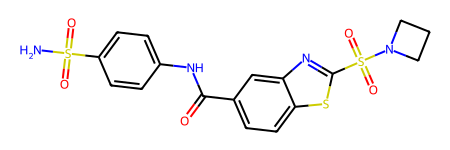

Most similar known molecule: 
pic50:  7.22


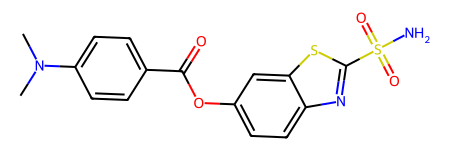

In [20]:
# determine a top hits threshold.
upper_quant = 0.9
hit_threshold = np.quantile(
    [x["pic50_model"] for x in meta_traj_binding[:]], upper_quant
)

max_score = max([x["pic50_model"] for x in meta_traj_binding[:]])
print(f"hit threshold: {hit_threshold}, max score: {max_score}\n")

# compare generated hits to known results
gen_hits = [
    v
    for v in meta_traj_binding[:]
    if v["pic50_model"] >= hit_threshold and v["qed_model"] >= 0.5
]
known_results = [v for v in outsample]

# compute cosine similarity between generated hits and known results
t1 = np.array([v["emb_smiles"] for v in gen_hits])
t2 = np.array([v["emb_smiles"] for v in known_results])
t1 /= np.sqrt(np.einsum("ij,ij->i", t1, t1))[:, np.newaxis]
t2 /= np.sqrt(np.einsum("ij,ij->i", t2, t2))[:, np.newaxis]
sims = np.einsum("ij,kj->ik", t1, t2)
i, j = np.stack(np.where(sims == sims.max()), 0)[:, 0]
# most similar generated hit
most_similar = gen_hits[i.item()]
# known result most similar to the generated hits
most_similar_to = known_results[j.item()]

print(
    "Most similar generated molecule to known molecules, cosine simularity score: ",
    sims[i.item(), j.item()],
)
print(
    f" logp_model: {most_similar['logp_model']} qed_model: {most_similar['qed_model']} pic50_model: {most_similar['pic50_model']}"
)
most_similar_mol = Chem.MolFromSmiles(most_similar["smiles"])
display(most_similar_mol)

print("Most similar known molecule: ")
print("pic50: ", known_results[j.item()]["pIC50"])
most_similar_to_mol = Chem.MolFromSmiles(most_similar_to["smiles"])
display(most_similar_to_mol)

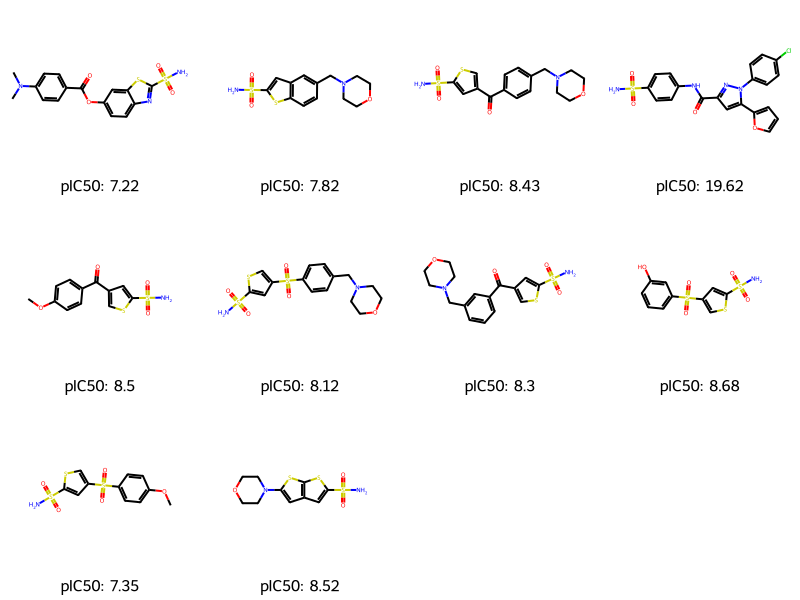

In [21]:
sims = np.einsum("ij,kj->ik", t1, t2)
near_mols = []
near_mol_pic50s = []
closest_n = 10
for k in range(0, closest_n):
    near_mols.append(
        Chem.MolFromSmiles(known_results[np.argsort(sims)[i][~k]]["smiles"])
    )
    near_mol_pic50s.append(known_results[np.argsort(sims)[i][~k]]["pIC50"])

img = Chem.Draw.MolsToGridImage(
    near_mols,
    molsPerRow=4,  # useSVG=True,
    legends=["pIC50: " + f"{near_mol_pic50s[k]}" for k in range(closest_n)],
)
img

Let's do the same for the control experiment.

hit threshold: 1.031036138534546, max score: 1.113954782485962

Most similar generated molecule to known molecules, cosine simularity score:  0.98715603
 logp_model: 3.6442813873291016 qed_model: 0.923605740070343 pic50_model: 1.0556515455245972


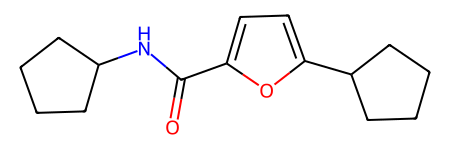

Most similar known molecule: 
pic50:  5.13


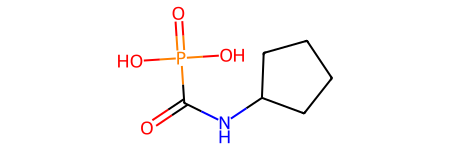

In [22]:
generated_traj = meta_traj_no_binding[:]

# determine a top hits threshold.
upper_quant = 0.9
hit_threshold = np.quantile([x["pic50_model"] for x in generated_traj], upper_quant)

max_score = max([x["pic50_model"] for x in generated_traj])
print(f"hit threshold: {hit_threshold}, max score: {max_score}\n")

# compare generated hits to known results
gen_hits = [
    v
    for v in generated_traj
    if v["pic50_model"] >= hit_threshold and v["qed_model"] >= 0.5
]
known_results = [v for v in outsample]

# compute cosine similarity between generated hits and known results
t1 = np.array([v["emb_smiles"] for v in gen_hits])
t2 = np.array([v["emb_smiles"] for v in known_results])
t1 /= np.sqrt(np.einsum("ij,ij->i", t1, t1))[:, np.newaxis]
t2 /= np.sqrt(np.einsum("ij,ij->i", t2, t2))[:, np.newaxis]
sims = np.einsum("ij,kj->ik", t1, t2)
i, j = np.stack(np.where(sims == sims.max()), 0)[:, 0]
# most similar generated hit
most_similar = gen_hits[i.item()]
# known result most similar to the generated hits
most_similar_to = known_results[j.item()]

print(
    "Most similar generated molecule to known molecules, cosine simularity score: ",
    sims[i.item(), j.item()],
)
print(
    f" logp_model: {most_similar['logp_model']} qed_model: {most_similar['qed_model']} pic50_model: {most_similar['pic50_model']}"
)
most_similar_mol = Chem.MolFromSmiles(most_similar["smiles"])
display(most_similar_mol)

print("Most similar known molecule: ")
print("pic50: ", known_results[j.item()]["pIC50"])
most_similar_to_mol = Chem.MolFromSmiles(most_similar_to["smiles"])
display(most_similar_to_mol)

Most similar molecules. Notice that lower pIC50 molecules are picked out versus the potency objective case.

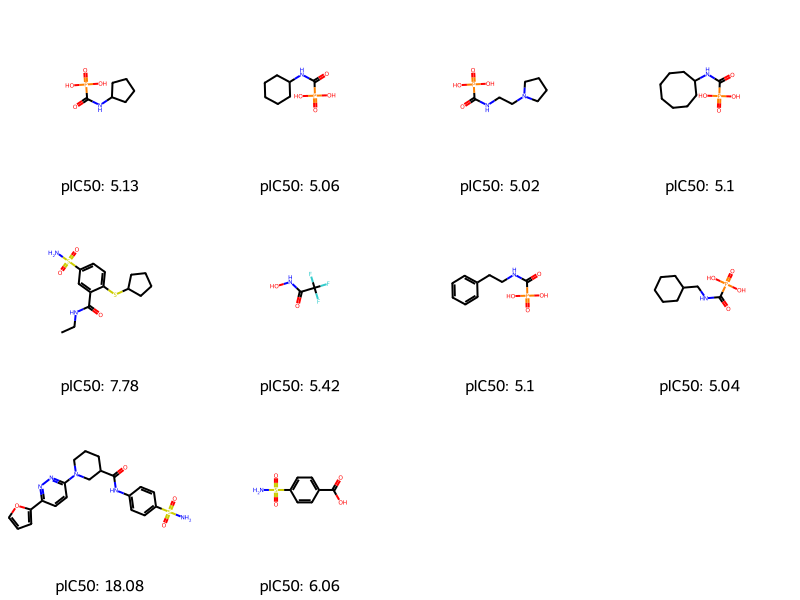

In [23]:
sims = np.einsum("ij,kj->ik", t1, t2)
near_mols = []
near_mol_pic50s = []
closest_n = 10
for k in range(0, closest_n):
    near_mols.append(
        Chem.MolFromSmiles(known_results[np.argsort(sims)[i][~k]]["smiles"])
    )
    near_mol_pic50s.append(known_results[np.argsort(sims)[i][~k]]["pIC50"])

img = Chem.Draw.MolsToGridImage(
    near_mols,
    molsPerRow=4,  # useSVG=True,
    legends=["pIC50: " + f"{near_mol_pic50s[k]}" for k in range(closest_n)],
)
img

Analysis plots used in the paper

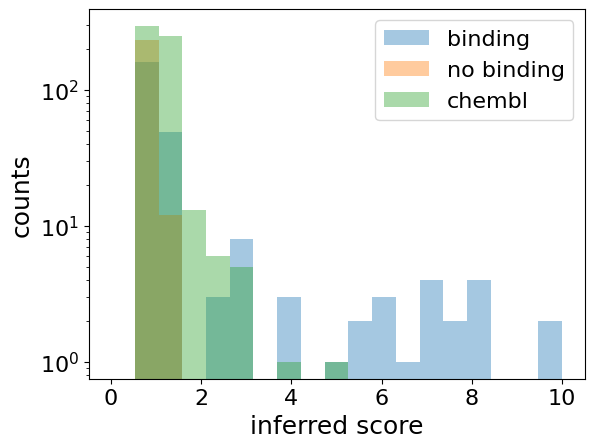

In [24]:
import matplotlib.pyplot as plt

SMALL_SIZE = 16
MEDIUM_SIZE = 18
BIGGER_SIZE = 20

plt.rc("font", size=SMALL_SIZE)  # controls default text sizes
plt.rc("axes", titlesize=SMALL_SIZE)  # fontsize of the axes title
plt.rc("axes", labelsize=MEDIUM_SIZE)  # fontsize of the x and y labels
plt.rc("xtick", labelsize=SMALL_SIZE)  # fontsize of the tick labels
plt.rc("ytick", labelsize=SMALL_SIZE)  # fontsize of the tick labels
plt.rc("legend", fontsize=SMALL_SIZE)  # legend fontsize
plt.rc("figure", titlesize=BIGGER_SIZE)  # fontsize of the figure title

matplotlib.rc("font", family="sans-serif")
matplotlib.rc("font", serif="Helvetica Neue")
matplotlib.rc("text", usetex="false")

_ = plt.hist(
    df[df.library == "meta_binding"].pic50_model,
    log=True,
    alpha=0.4,
    bins=np.linspace(0.0, 10.0, 20),
    label="binding",
)
_ = plt.hist(
    df[df.library == "meta_qed"].pic50_model,
    log=True,
    alpha=0.4,
    bins=np.linspace(0.0, 10.0, 20),
    label="no binding",
)
_ = plt.hist(
    df[df.library == "chembl"].pic50_model,
    log=True,
    alpha=0.4,
    bins=np.linspace(0.0, 10.0, 20),
    label="chembl",
)
plt.legend()

plt.xlabel("inferred score")
plt.ylabel("counts")
plt.grid(False)
plt.legend()
plt.savefig("score_hist.pdf", bbox_inches="tight")

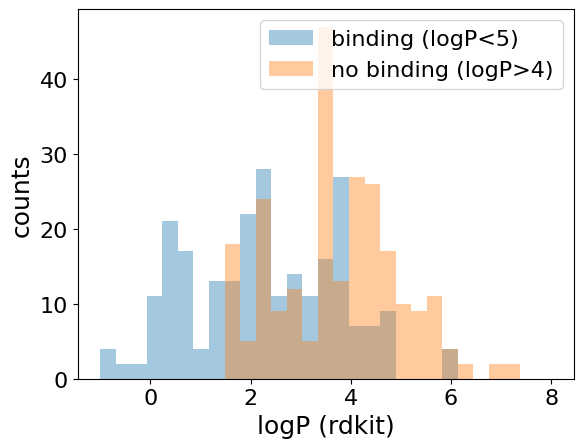

In [25]:
import matplotlib.pyplot as plt

SMALL_SIZE = 16
MEDIUM_SIZE = 18
BIGGER_SIZE = 20

plt.rc("font", size=SMALL_SIZE)  # controls default text sizes
plt.rc("axes", titlesize=SMALL_SIZE)  # fontsize of the axes title
plt.rc("axes", labelsize=MEDIUM_SIZE)  # fontsize of the x and y labels
plt.rc("xtick", labelsize=SMALL_SIZE)  # fontsize of the tick labels
plt.rc("ytick", labelsize=SMALL_SIZE)  # fontsize of the tick labels
plt.rc("legend", fontsize=SMALL_SIZE)  # legend fontsize
plt.rc("figure", titlesize=BIGGER_SIZE)  # fontsize of the figure title

matplotlib.rc("font", family="sans-serif")
matplotlib.rc("font", serif="Helvetica Neue")
matplotlib.rc("text", usetex="false")

_ = plt.hist(
    df[df.library == "meta_binding"].logp_rdkit,
    log=False,
    alpha=0.4,
    bins=np.linspace(-1.0, 8.0, 30),
    label="binding (logP<5)",
)
_ = plt.hist(
    df[df.library == "meta_qed"].logp_rdkit,
    log=False,
    alpha=0.4,
    bins=np.linspace(-1.0, 8.0, 30),
    label="no binding (logP>4)",
)
plt.xlabel("logP (rdkit)")
plt.ylabel("counts")
plt.grid(False)
plt.legend()
plt.savefig("logp_hist.pdf", bbox_inches="tight")